In [1]:
import numpy as np
import json
import os
import string
import pandas as pd
import time
from dask.distributed import Client, LocalCluster
import dask.bag as db
from dask.distributed import SpecCluster
from collections import Counter
from dask import delayed
import dask.dataframe as dd
import nltk
from nltk.corpus import stopwords
import string
import re
import matplotlib.pyplot as plt
import seaborn as sns
import time
from dask.distributed import Client, LocalCluster
import warnings
from mpl_toolkits.mplot3d import Axes3D
import tqdm
# Download stopwords only once
nltk.download('stopwords')

# Create a list of stopwords in English
stopwords_list = stopwords.words('english')

# Set options for pandas to display all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
from dask.distributed import Client, SSHCluster

machine1 = '10.67.22.152'
machine2 = '10.67.22.250'
#machine3 = '10.67.22.254'

In [3]:
import string
import re
from iso3166 import countries

translator = str.maketrans('', '', string.punctuation)

def load_json_data(filename):
    """
    Load JSON data from a file.

    Args:
        filename (str): Name of the JSON file.

    Returns:
        dict: Loaded JSON data as a dictionary.

    """
    with open(os.path.join(path, filename), 'r') as file:
        json_data = json.load(file)
    return json_data

def country_paper(paper):
    """
    Extract the countries mentioned in a paper's metadata.

    Args:
        paper (dict): Paper content as a dictionary.

    Returns:
        list: List of country names mentioned in the paper.

    """
    countries = []
    
    if 'authors' in paper['metadata']:
        authors = paper['metadata']['authors']
        if len(authors) > 0:
            for author in authors:
                if 'affiliation' in author:
                    affiliation = author['affiliation']
                    if 'location' in affiliation:
                        location = affiliation['location']
                        if 'country' in location:
                            country = location['country']
                            if len(country) == 0:
                                countries.append('NN') 
                            else:
                                countries.append(country)
                        else:
                            countries.append('NN')
                    else:
                        countries.append('NN')
                else:
                    countries.append('NN')
        else:
            countries.append('NAuthor')
    return countries

def replace_elements(l1, l2, l3):
    """
    Replace elements in a list based on a mapping dictionary.

    Args:
        l1 (list): List to modify.
        l2 (list): List of elements to replace.
        l3 (list): List of replacement elements.

    Returns:
        list: Modified list with replaced elements.

    """
    element_map = {key: value for key, value in zip(l2, l3)}
    result = [element_map.get(element, element) for element in l1]
    return result

def preprocess_string(string):
    """
    Preprocess a string by cleaning and filtering its content.

    Args:
        string (str): Input string.

    Returns:
        list: List of filtered words.

    """
    cleaned_string = re.sub(r'[^a-zA-Z\s]', '', string)
    words = list(set(cleaned_string.lower().strip().split()))
    filtered_words = [word.translate(translator) for word in words if word.lower() not in stopwords_list]
    return filtered_words

def process_country_data(clist, flattened_list2):
    """
    Process country data to standardize country names.

    Args:
        clist (list): List of country names to process.
        flattened_list2 (list): Flattened list of preprocessed country names.

    Returns:
        list: List of standardized country names.

    """
    l_change = ['kingdom' , 'america' , 'zealand' , 'arabia' , 'us']
    l_standard = ['uk', 'usa', 'newzealand', 'saudiarabia' , 'usa']
    nested_list_country = [preprocess_string(word) for word in clist]
    flattened_list = [item for sublist in nested_list_country for item in sublist]
    final_country_change = [item for item in flattened_list if item in flattened_list2]
    final_country = replace_elements(final_country_change , l_change , l_standard )
    return final_country

def remove_values_from_list(lst, values_to_remove):
    """
    Remove specific values from a list.

    Args:
        lst (list): List to modify.
        values_to_remove (list): List of values to remove.

    Returns:
        list: Modified list with values removed.

    """
    result = [x for x in lst if x not in values_to_remove]
    return result

def uni_paper(paper):
    """
    Extract the universities mentioned in a paper's metadata.

    Args:
        paper (dict): Paper content as a dictionary.

    Returns:
        dict: Dictionary with universities and their respective counts.

    """
    uni = []
    
    if 'authors' in paper['metadata']:
        authors = paper['metadata']['authors']
        if len(authors) > 0:
            for author in authors:
                if 'affiliation' in author:
                    affiliation = author['affiliation']
                    if 'institution' in affiliation:
                        institution = affiliation['institution']
                        if len(institution) == 0:
                            uni.append('NN')
                        else:
                            uni.append(institution)    
                    else:
                        uni.append('NN')
                else:
                    uni.append('NN')
        else:
            uni.append('NA')

    return uni


clist2 = [country.name for country in countries]
nested_list_country2 = [preprocess_string(word) for word in clist2]
flattened_list2 = list([item for sublist in nested_list_country2 for item in sublist])
flattened_list2.extend(['usa' , 'uk' , 'nn' , 'nauthor'])
flattened_list2 = remove_values_from_list(flattened_list2 , ['united' , 'states' , 'new' , 'peoples' , 'islamic' , 'republic' , 'saudi'])


In [6]:
path = '/mnt/covid/data/papers1'
json_list = os.listdir(path)

In [11]:
# Define the lists of parameters
num_workers_list = [6,8,9,10,11,12]  # Different numbers of workers
threads_per_worker_list = [4]  # Different numbers of threads per worker
npartitions_list = [1,15,30,45,60,75]  # Different npartitions
n_paper = 1000
amount = 10

# Create an empty list to store the results
execution_times = []
i = 0
# Loop over the parameters
while i<5:
    for num_workers in tqdm.tqdm(num_workers_list):
        for threads_per_worker in tqdm.tqdm(threads_per_worker_list):
            for npartitions in tqdm.tqdm(npartitions_list):
                # Create a LocalCluster with the current parameters
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")

                    cluster = SSHCluster([machine1,machine1, machine2],
                    scheduler_options={"port": 0, "dashboard_address": ":8687"}
                    ,worker_options={"n_workers":num_workers})
                    
                    client = Client(cluster)

                    # Start the timer
                    start_time = time.time()


                    df_country = (
                        db.from_sequence(json_list[0:n_paper], partition_size=npartitions)
                        .map(load_json_data)
                        .map(country_paper)
                        .map(lambda x: process_country_data(x, flattened_list2))
                        .flatten()
                        .frequencies()
                        .to_dataframe(columns=['Country', 'Count'])
                        .nlargest(n=amount, columns='Count')
                    )

                    # Compute the result
                    result = df_country.compute()

                    # End the timer
                    end_time = time.time()
                    execution_time = end_time - start_time

                    # Store the execution time in the list
                    execution_times.append((2*num_workers, threads_per_worker, npartitions, execution_time))

                    # Close the Dask client and cluster
                    client.close()
                    cluster.close()
    i = i+1

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]2023-07-08 12:44:03,143 - distributed.deploy.ssh - INFO - 2023-07-08 12:44:03,142 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2023-07-08 12:44:03,204 - distributed.deploy.ssh - INFO - 2023-07-08 12:44:03,203 - distributed.scheduler - INFO - State start
2023-07-08 12:44:03,212 - distributed.deploy.ssh - INFO - 2023-07-08 12:44:03,210 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.152:41701
2023-07-08 12:44:04,678 - distributed.deploy.ssh - INFO - 2023-07-08 12:44:04,676 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.152:37967'
2023-07-08 12:44:04,684 - distributed.deploy.ssh - INFO - 2023-07-08 12:44:04,684 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.152:39633'
2023-07-08 12:44:05,242 - distributed.deploy.ssh - INFO - 2023-07-08 12:44:05

In [25]:
time_df = pd.DataFrame(execution_times , columns=['Worker', 'Thread', 'Partition', 'Time'])
# Group by the first three columns and calculate the mean of the fourth column
df = time_df.groupby(['Worker', 'Thread', 'Partition'])['Time'].mean().reset_index()

In [26]:
min_row = df[df['Time'] == df['Time'].min()]
min_row

,Worker,Thread,Partition,Time
10,16,4,60,1.748556


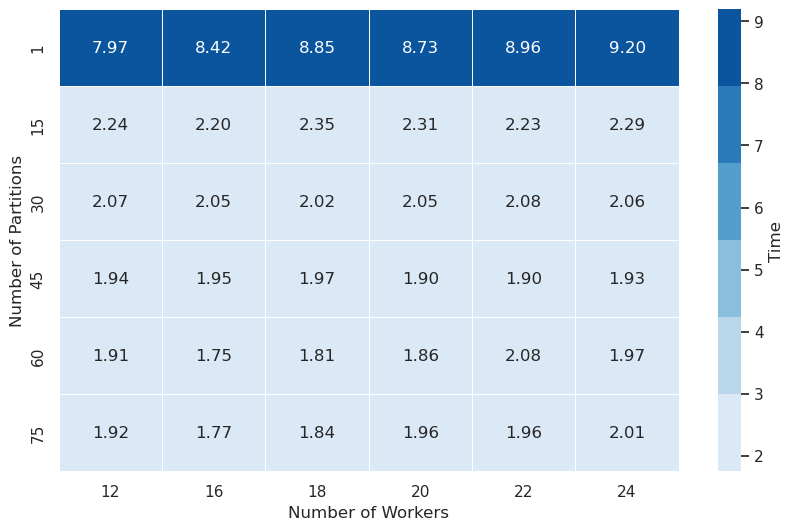

<Figure size 640x480 with 0 Axes>

In [27]:
# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Partition', columns='Worker', values='Time', aggfunc=np.mean)

# Create a color map for the heatmaps
cmap = sns.color_palette("Blues")

# Plot the multi-layer heatmaps
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap=cmap, linewidths=0.5, ax=ax, cbar_kws={'label': 'Time'})

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Number of Partitions')

# Add bar labels along the X and Y axes
ax.set_xticklabels(heatmap_data.columns)
ax.set_yticklabels(heatmap_data.index)

# Show the plot
plt.show()
plt.savefig('country_heatmap.png')

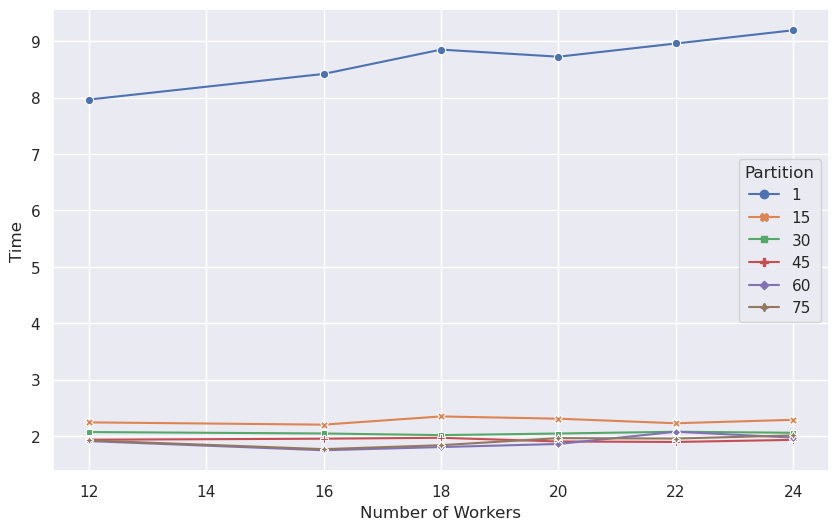

<Figure size 640x480 with 0 Axes>

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Worker', columns='Partition', values='Time', aggfunc=np.mean)

# Set the style for the plot
sns.set(style="darkgrid")

# Create the line plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.lineplot(data=heatmap_data, dashes=False, markers=True)

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Time')

# Add a legend
ax.legend(title='Partition')

# Show the plot
plt.show()
plt.savefig('country_line_plot.png')

In [29]:
client.close()
cluster.close()

In [30]:
# Define the lists of parameters
num_workers_list = [6,8,9,10,11,12]  # Different numbers of workers
threads_per_worker_list = [4]  # Different numbers of threads per worker
npartitions_list = [1,15,30,45,60,75]  # Different npartitions
n_paper = 1000
amount = 10

# Create an empty list to store the results
execution_times = []
i = 0
# Loop over the parameters
while i<5:
    for num_workers in tqdm.tqdm(num_workers_list):
        for threads_per_worker in tqdm.tqdm(threads_per_worker_list):
            for npartitions in tqdm.tqdm(npartitions_list):
                # Create a LocalCluster with the current parameters
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")

                    cluster = SSHCluster([machine1,machine1, machine2],
                    scheduler_options={"port": 0, "dashboard_address": ":8687"}
                    ,worker_options={"n_workers":num_workers})
                    
                    client = Client(cluster)

                    # Start the timer
                    start_time = time.time()


                    df_country = (
                        db.from_sequence(json_list[0:n_paper] , partition_size = npartitions)
                        .map(load_json_data)
                        .map(uni_paper)
                        .flatten()
                        .frequencies()
                        .to_dataframe(columns=['University', 'Count'])
                        .nlargest(n=amount, columns='Count')
                    )

                    # Compute the result
                    result = df_country.compute()

                    # End the timer
                    end_time = time.time()
                    execution_time = end_time - start_time

                    # Store the execution time in the list
                    execution_times.append((2*num_workers, threads_per_worker, npartitions, execution_time))

                    # Close the Dask client and cluster
                    client.close()
                    cluster.close()
    i = i+1


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]2023-07-08 14:33:34,166 - distributed.deploy.ssh - INFO - 2023-07-08 14:33:34,165 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2023-07-08 14:33:34,225 - distributed.deploy.ssh - INFO - 2023-07-08 14:33:34,224 - distributed.scheduler - INFO - State start
2023-07-08 14:33:34,233 - distributed.deploy.ssh - INFO - 2023-07-08 14:33:34,232 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.152:46699
2023-07-08 14:33:35,640 - distributed.deploy.ssh - INFO - 2023-07-08 14:33:35,637 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.152:43953'
2023-07-08 14:33:35,658 - distributed.deploy.ssh - INFO - 2023-07-08 14:33:35,657 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.152:35069'
2023-07-08 14:33:35,660 - distributed.deploy.ssh - INFO - 2023-07-08 14:33:35

In [39]:
time_df = pd.DataFrame(execution_times , columns=['Worker', 'Thread', 'Partition', 'Time'])
# Group by the first three columns and calculate the mean of the fourth column
df = time_df.groupby(['Worker', 'Thread', 'Partition'])['Time'].mean().reset_index()

In [41]:
min_row = df[df['Time'] == df['Time'].min()]
min_row

,Worker,Thread,Partition,Time
11,16,4,75,1.708468


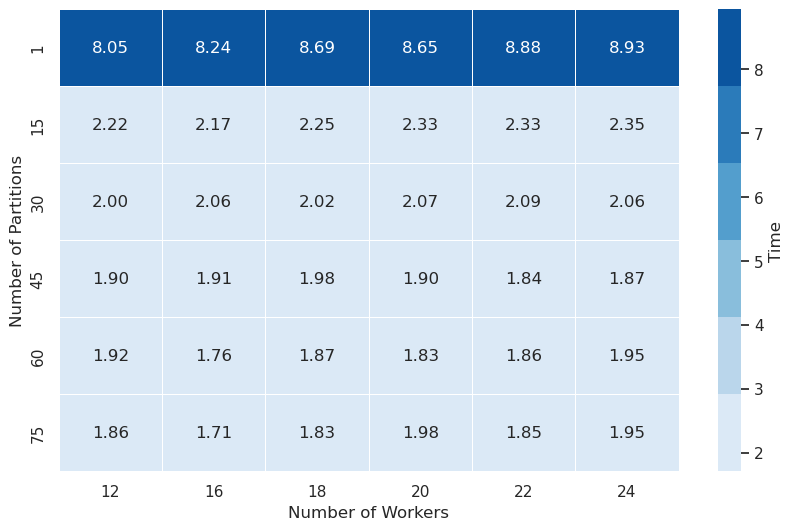

In [40]:
# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Partition', columns='Worker', values='Time', aggfunc=np.mean)

# Create a color map for the heatmaps
cmap = sns.color_palette("Blues")

# Plot the multi-layer heatmaps
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap=cmap, linewidths=0.5, ax=ax, cbar_kws={'label': 'Time'})

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Number of Partitions')

# Add bar labels along the X and Y axes
ax.set_xticklabels(heatmap_data.columns)
ax.set_yticklabels(heatmap_data.index)

# Show the plot
plt.show()


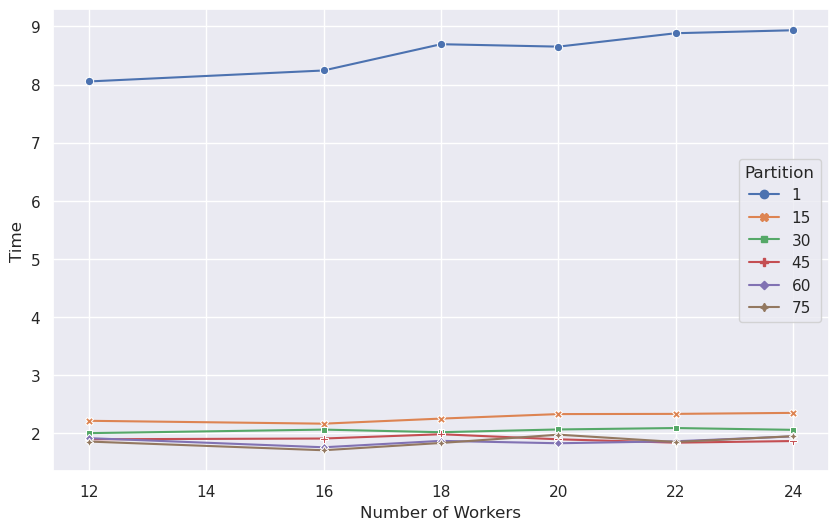

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Worker', columns='Partition', values='Time', aggfunc=np.mean)

# Set the style for the plot
sns.set(style="darkgrid")

# Create the line plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.lineplot(data=heatmap_data, dashes=False, markers=True)

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Time')

# Add a legend
ax.legend(title='Partition')

# Show the plot
plt.show()


In [38]:
client.close()
cluster.close()